## Import neccesary packages

In [1]:
import pypsa
import matplotlib.pyplot as plt
plt.style.use('bmh')
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 600
import cartopy.crs as ccrs

# Optional, hide warnings
import warnings
warnings.filterwarnings("ignore")

import pandas as pd

## Select network to analyse

In [2]:
n = pypsa.Network("solved_network_with_chargers.nc")

INFO:pypsa.io:Imported network solved_network_with_chargers.nc has buses, carriers, generators, lines, links, loads, storage_units, stores


In [3]:
comp = pypsa.Network("solved_std_network.nc")

INFO:pypsa.io:Imported network solved_std_network.nc has buses, carriers, generators, lines, links, loads, storage_units, stores


# Visualization

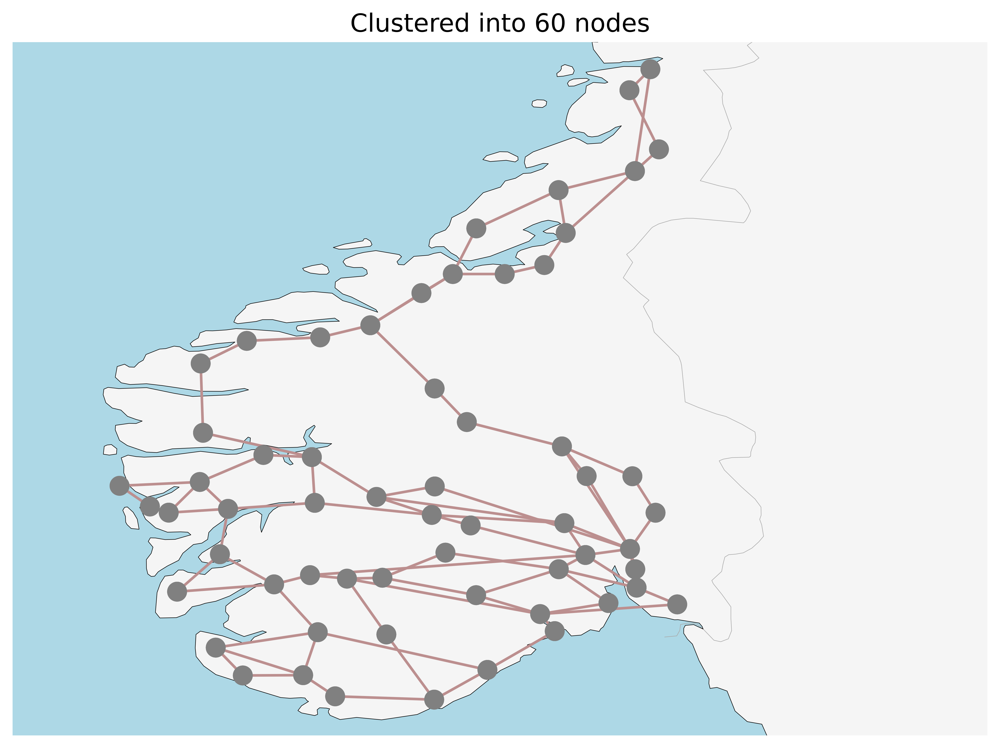

In [75]:
fif,ax = plt.subplots(
        figsize=(10,10),
        subplot_kw={"projection":ccrs.Orthographic()}
    )

n.plot(ax=ax,
       title="Clustered into 60 nodes",
       bus_colors="gray",
       branch_components=["Line"],
       #line_widths=n.lines.s_nom/10e2,
       #line_colors=loading,
       line_cmap=plt.cm.viridis,
       color_geomap=True,
       #bus_sizes=0
      )
ax.axis("off");

# Components

In [5]:
# Network with chargers
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Components '{}' has {} entries".format(c.name,len(c.df)))

Components 'Bus' has 180 entries
Components 'Carrier' has 17 entries
Components 'Line' has 89 entries
Components 'LineType' has 34 entries
Components 'TransformerType' has 14 entries
Components 'Link' has 240 entries
Components 'Load' has 60 entries
Components 'Generator' has 125 entries
Components 'StorageUnit' has 40 entries
Components 'Store' has 120 entries


In [8]:
# Comparison network
for c in comp.iterate_components(list(n.components.keys())[2:]):
    print("Components '{}' has {} entries".format(c.name,len(c.df)))

Components 'Bus' has 180 entries
Components 'Carrier' has 17 entries
Components 'Line' has 90 entries
Components 'LineType' has 34 entries
Components 'TransformerType' has 14 entries
Components 'Link' has 240 entries
Components 'Load' has 39 entries
Components 'Generator' has 119 entries
Components 'StorageUnit' has 40 entries
Components 'Store' has 120 entries


# Snapshots

In [30]:
#First snapshot
n.snapshots[1]

Timestamp('2013-01-02 00:00:00')

In [7]:
#Last snapshot
n.snapshots[-1]

Timestamp('2013-12-31 00:00:00')

In [33]:
len(n.snapshots)

365

In [12]:
len(n.snapshots)-len(comp.snapshots)

0

### Chargers

In [14]:
chargers = pd.read_csv("tot_chargers.csv")
print("Total capacity of " + str(len(chargers)) + " chargers in GW: ", chargers["capacity"].sum()/1e6)
# These are then utilized to charge based on the EV usage time series in the thesis

Total capacity of 26559 chargers in GW:  1.3895112000000003


# Loads

Total from chargers GW:  14541.0525


5.339331937500001

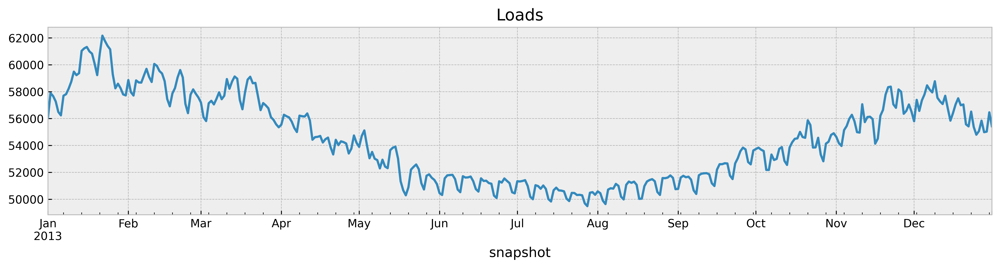

In [74]:
n.loads_t.p_set.sum(axis=1).plot(figsize=(15,3))
plt.title("Loads")
print("Total from chargers GW: ", n.loads_t.p_set.sum().sum()/1e3-comp.loads_t.p_set.sum().sum()/1e3)
comp.loads_t.p_set.sum().sum()/1e6

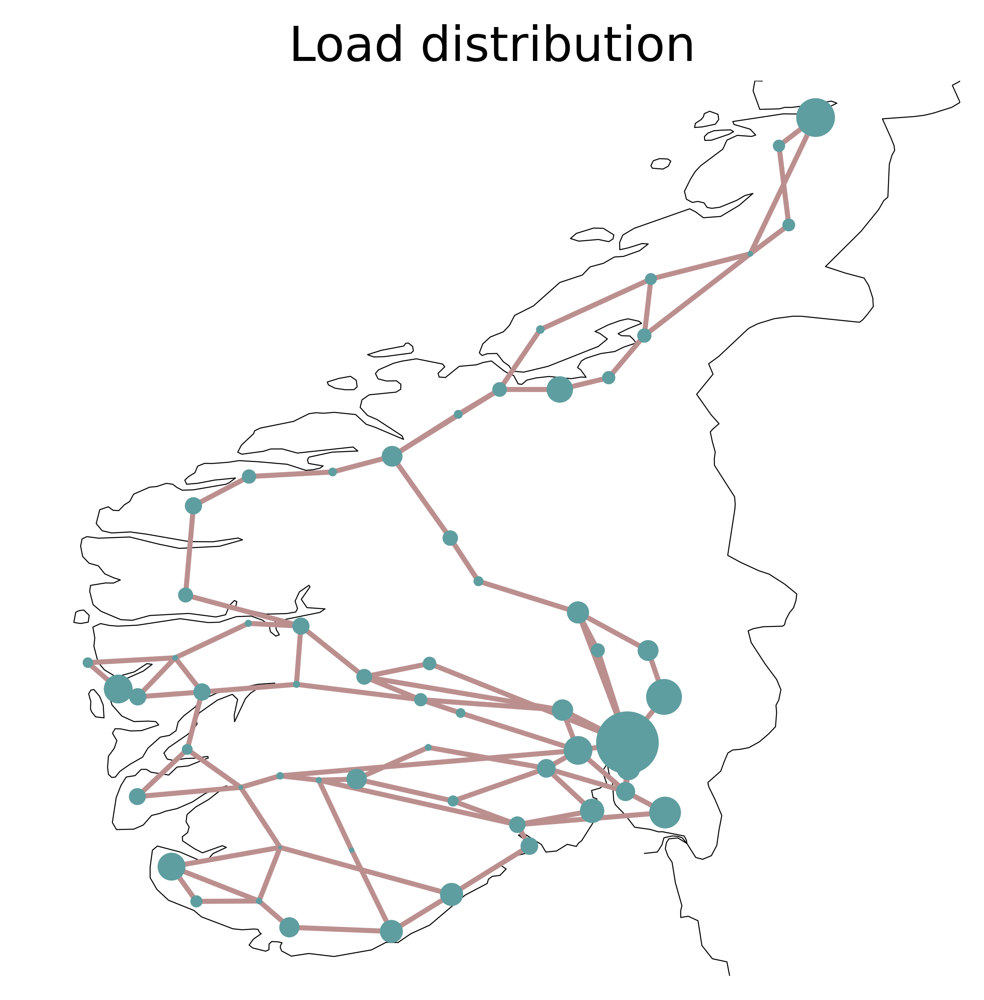

In [16]:
load = n.loads_t.p_set.sum(axis=0).groupby(n.loads.bus).sum()

fig = plt.figure()
ax = plt.axes(projection=ccrs.EqualEarth())

n.plot(
    ax=ax,
    bus_sizes=load / 0.3e8,
    title = "Load distribution"
);

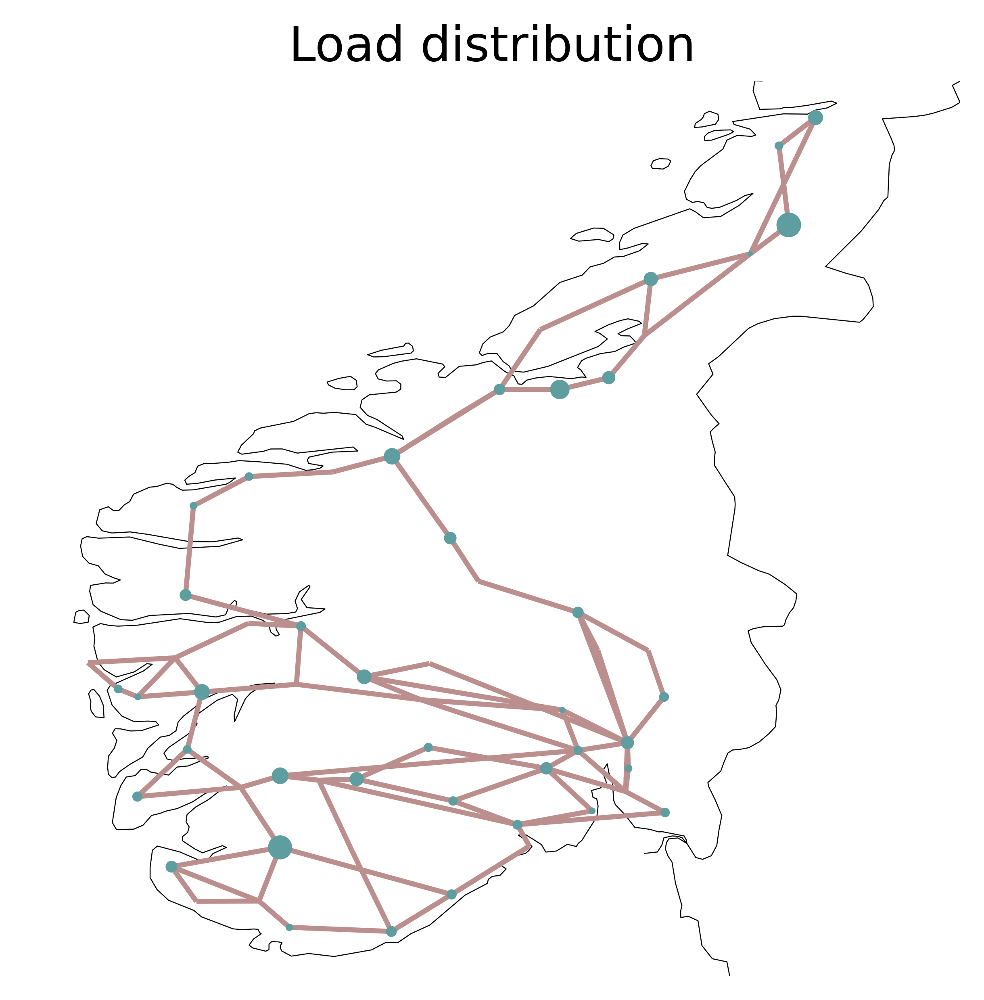

In [17]:
load = comp.loads_t.p_set.sum(axis=0).groupby(n.loads.bus).sum()

fig = plt.figure()
ax = plt.axes(projection=ccrs.EqualEarth())

n.plot(
    ax=ax,
    bus_sizes=load / 0.3e8,
    title = "Load distribution"
);

## Line Loading

In [18]:
n.snapshots[20]

Timestamp('2013-01-21 00:00:00')

In [140]:
n.snapshots[210]

Timestamp('2013-07-30 00:00:00')

In [10]:
jan21 = n.snapshots[20]

In [11]:
july30 = n.snapshots[210]

In [142]:
loading_n_jan21 = n.lines_t.p0.loc[jan21] / n.lines.s_nom
loading_n_july30 = n.lines_t.p0.loc[july30] / n.lines.s_nom
loading_comp_jan21 = comp.lines_t.p0.loc[jan21] / comp.lines.s_nom
loading_comp_july30 = comp.lines_t.p0.loc[july30] / comp.lines.s_nom

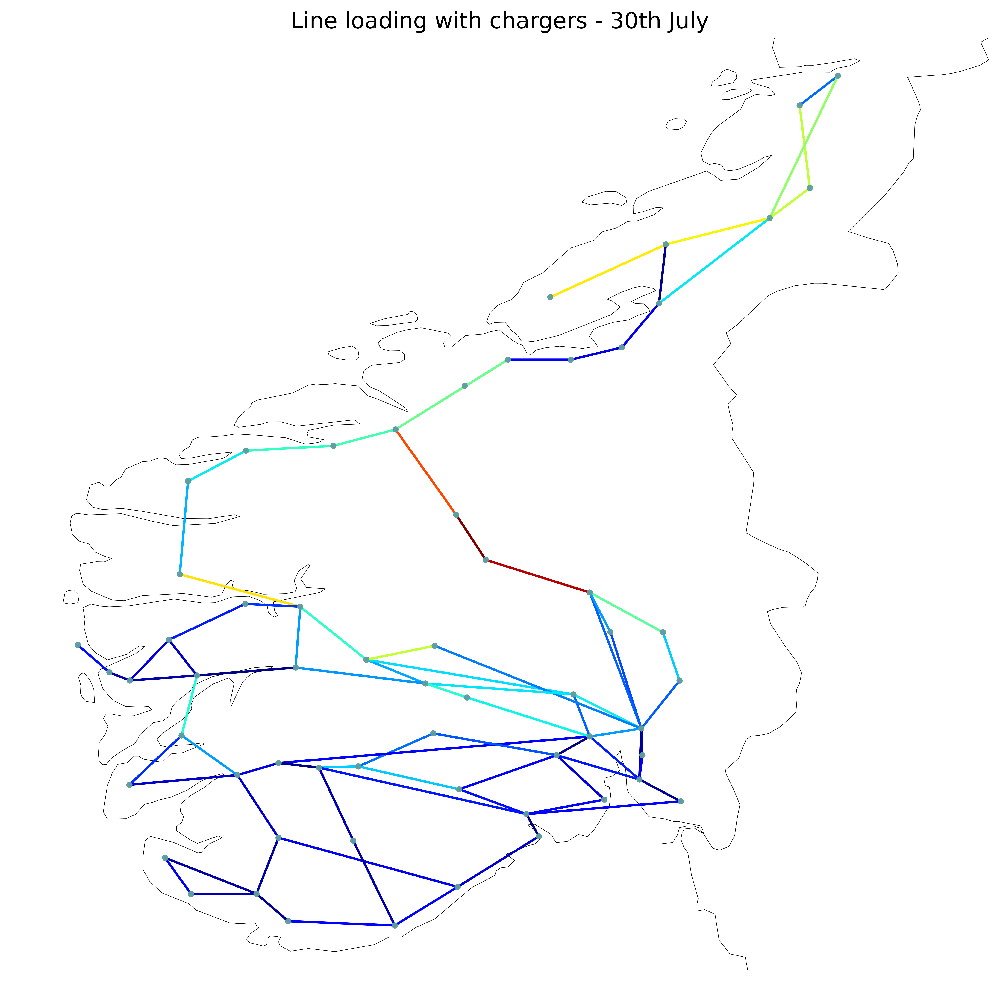

In [15]:
fig, ax = plt.subplots(subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(9, 9))
n.plot(
    ax=ax,
    line_colors=abs(loading_n_july30),
    line_cmap=plt.cm.jet,
    title="Line loading with chargers - 30th July",
    bus_sizes=1e-3,
    bus_alpha=0.7,
)
fig.tight_layout()

In [18]:
n.lines.loc[n.lines["s_nom"].idxmax()]
(n.lines_t.p0.loc[july30] / n.lines.s_nom).idxmax()
n.lines.loc["63"]

bus0                                     NO0 29
bus1                                     NO0 46
num_parallel                                0.0
length                                46.215811
type                Al/St 240/40 4-bundle 380.0
s_max_pu                                    0.7
s_nom                                       0.0
capital_cost                        1905.775032
s_nom_extendable                           True
s_nom_min                                   0.0
x                                           inf
r                                           inf
b                                           0.0
carrier                                      AC
x_pu_eff                                    inf
r_pu_eff                                    inf
s_nom_opt                           6314.086666
v_nom                                     380.0
g                                           0.0
s_nom_max                                   inf
build_year                              

In [32]:
# Cost of upgrading the line million nok
n.lines.loc["63"]["capital_cost"]*(n.lines.loc["63"]["s_nom_opt"]-comp.lines.loc["63"]["s_nom_opt"])/1e6*11.5

138.38162379796339

In [22]:
n.buses.loc["NO0 46"]

v_nom               380.0
x                9.266968
y               63.092894
country                NO
control                PQ
generator                
carrier                AC
type                     
unit                     
v_mag_pu_set          1.0
v_mag_pu_min          0.0
v_mag_pu_max          inf
sub_network              
Name: NO0 46, dtype: object

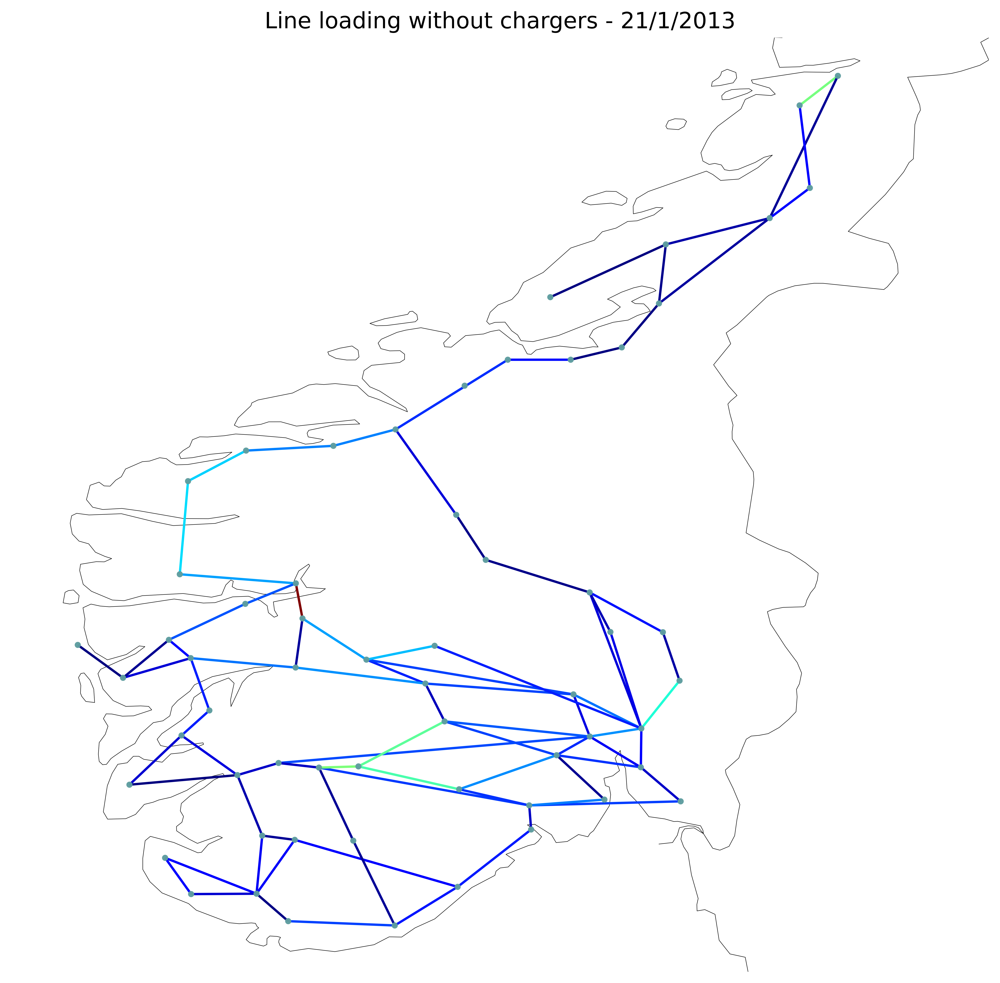

In [143]:
dtime = jan21
dmy = str(dtime.day) + "/" +str(dtime.month)+"/"+str(dtime.year)
fig, ax = plt.subplots(subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(9, 9))
comp.plot(
    ax=ax,
    line_colors=abs(loading_comp_july30),
    line_cmap=plt.cm.jet,
    title="Line loading without chargers - " +dmy,
    bus_sizes=1e-3,
    bus_alpha=0.7,
)
fig.tight_layout();

In [30]:
comp.lines.loc["63"]

bus0                                     NO0 29
bus1                                     NO0 44
num_parallel                                0.0
length                                46.215811
type                Al/St 240/40 4-bundle 380.0
s_max_pu                                    0.7
s_nom                                       0.0
capital_cost                        1906.042424
s_nom_extendable                           True
s_nom_min                                   0.0
x                                           inf
r                                           inf
b                                           0.0
carrier                                      AC
x_pu_eff                                    inf
r_pu_eff                                    inf
s_nom_opt                              0.023111
v_nom                                     380.0
g                                           0.0
s_nom_max                                   inf
build_year                              

Average price:  0.5657396503204386


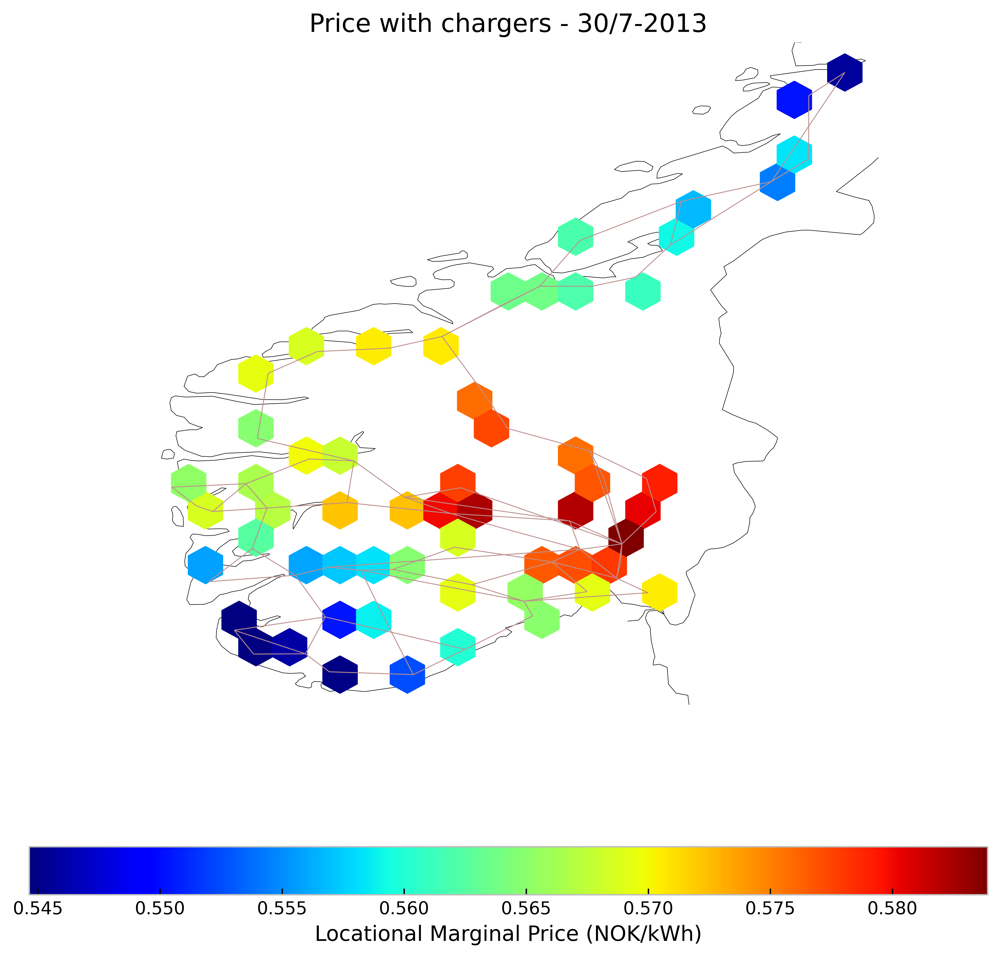

In [159]:
dtime = july30
dmy = str(dtime.day) + "/" +str(dtime.month)+"-"+str(dtime.year)
fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))
plt.hexbin(
    n.buses.x,
    n.buses.y,
    gridsize=20,
    C=n.buses_t.marginal_price.loc[dtime]*11.5/1000,
    cmap=plt.cm.jet,
    zorder=3,
)
n.plot(ax=ax, line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0, title="Price with chargers - " + dmy)

cb = plt.colorbar(location="bottom")
cb.set_label("Locational Marginal Price (NOK/kWh)")
fig.tight_layout()
avg_p = n.buses_t.marginal_price.loc[dtime].sum()*11.5/1000/len(n.buses)
print("Average price: ",avg_p)

Average price:  0.37772055291210754


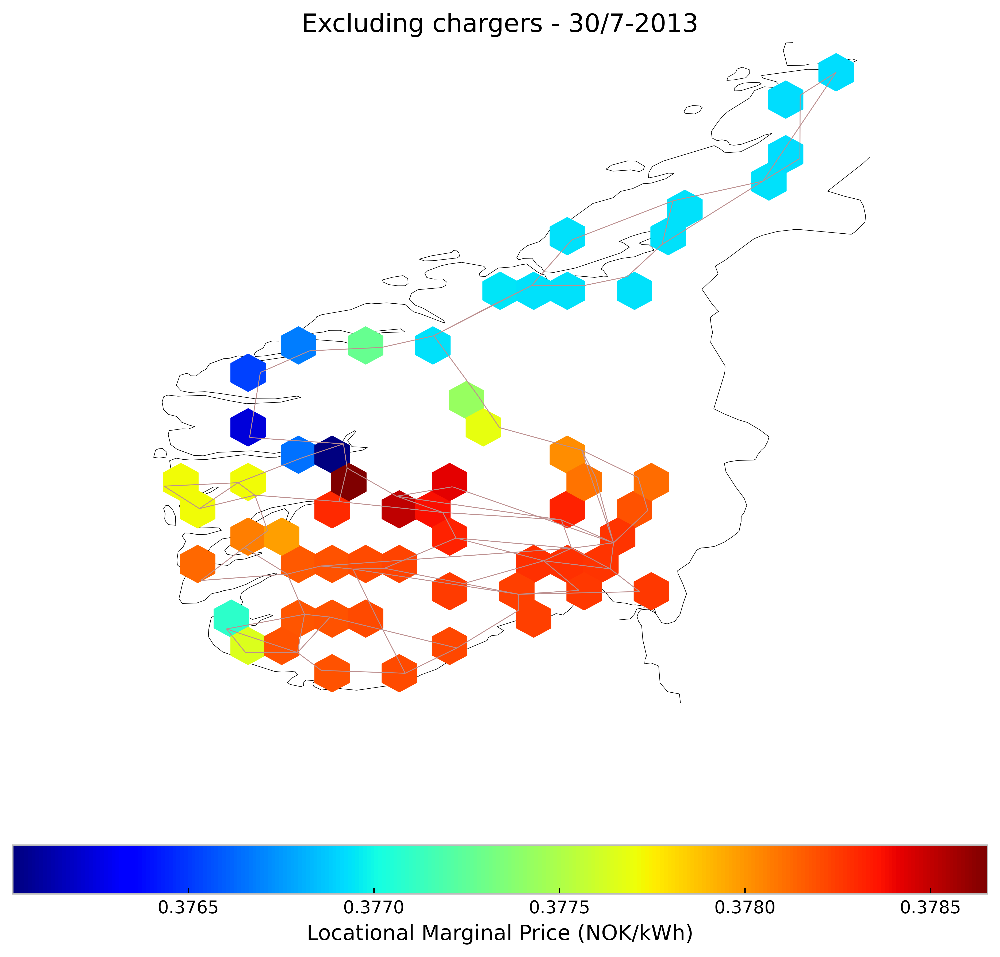

In [164]:
dtime = july30
dmy = str(dtime.day) + "/" +str(dtime.month)+"-"+str(dtime.year)
fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))

plt.hexbin(
    comp.buses.x,
    comp.buses.y,
    gridsize=20,
    C=comp.buses_t.marginal_price.loc[dtime]*11.5/1000,
    cmap=plt.cm.jet,
    zorder=3,
)
comp.plot(ax=ax, line_widths=pd.Series(0.5, comp.lines.index), bus_sizes=0, title="Excluding chargers - " + dmy)

cb = plt.colorbar(location="bottom")
cb.set_label("Locational Marginal Price (NOK/kWh)")
fig.tight_layout()
avg_p_comp = comp.buses_t.marginal_price.loc[dtime].sum()*11.5/1000/len(comp.buses)
print("Average price: ",avg_p_comp)

In [161]:
print("Increase in price %: ", avg_p/avg_p_comp*100)

Increase in price %:  149.77730122408286


## Average price january 21th

In [99]:
print("Avg price comp: ",comp.buses_t.marginal_price.loc[jan21].sum()/1000*11.5/len(comp.buses))
print("Avg price chargers: ",n.buses_t.marginal_price.loc[jan21].sum()/1000*11.5/len(n.buses))

Avg price comp:  0.37754806826001547
Avg price chargers:  1.0523807651645067


## Average price july 30th

In [19]:
print("Avg price comp: ",comp.buses_t.marginal_price.loc[july30].sum()/1000*11.5/len(comp.buses))
print("Avg price chargers: ",n.buses_t.marginal_price.loc[july30].sum()/1000*11.5/len(n.buses))

Avg price comp:  0.37772055291210754
Avg price chargers:  0.5657396503204385


### Transmission Line Expansion

In [100]:
(n.lines.s_nom_opt - n.lines.s_nom).sum()/1000

471.9666033358138

In [101]:
(comp.lines.s_nom_opt - comp.lines.s_nom).sum()/1000

1.109309335639086

263.01929374119777

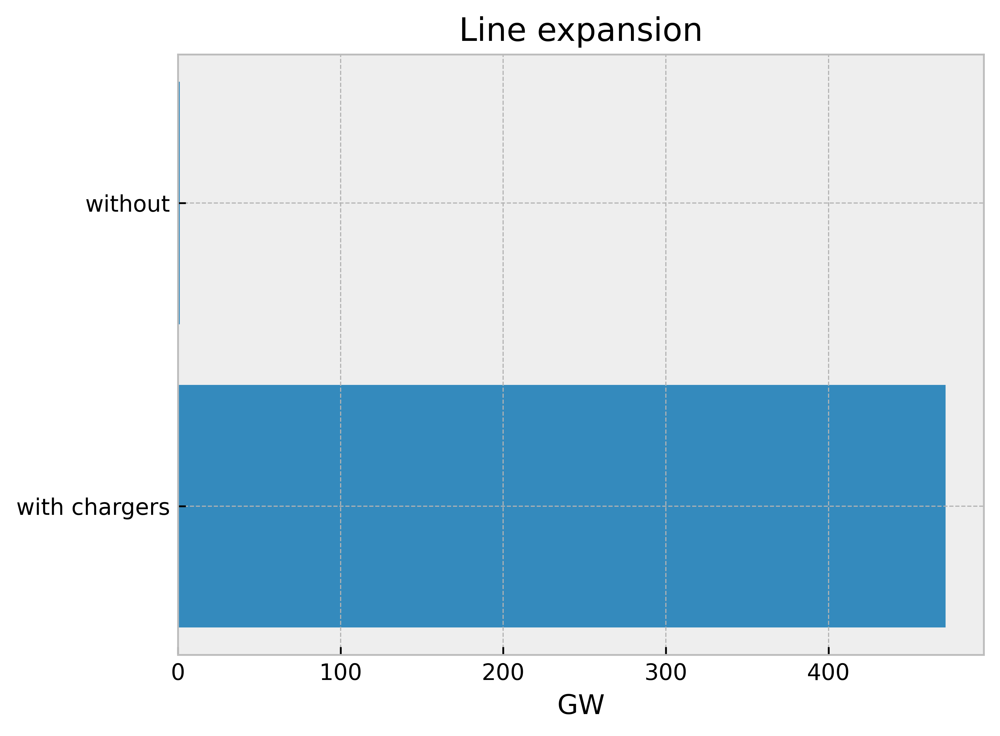

In [66]:
line_exp = [(n.lines.s_nom_opt - n.lines.s_nom).sum()/1000, (comp.lines.s_nom_opt - comp.lines.s_nom).sum()/1000]   # /1000 for converting to GW
bars = ("with chargers", "without")

df = pd.DataFrame ({
        'Group':  bars,
        'Value': line_exp
})
plt.barh(y=df.Group, width=df.Value)
plt.xlabel('GW')
plt.title("Line expansion")
# Required line expansion in GW
(n.lines.s_nom_opt - n.lines.s_nom).sum()/1000 - (comp.lines.s_nom_opt - comp.lines.s_nom).sum()/1000
(comp.lines.s_nom_opt + comp.lines.s_nom).sum()/1000

# Objective value

In [248]:
# Annualized profits from installing infrastructure for chargers
print("Difference in total system annual costs: ",(n.objective / 1e9 - comp.objective / 1e9)*11.5) # Billion NOK p.a
print("CS total system annual cost: ", n.objective/1e9*11.5)
print("Ex CS total system annual cost: ", comp.objective/1e9*11.5)

Difference in total system annual costs:  279.72698658472365
CS total system annual cost:  282.06063829323637
Ex CS total system annual cost:  2.3336517085126633


### Optimal Generator/Storage Capacities

In [61]:
n.generators.groupby("carrier").p_nom_opt.sum()/1e3 #GW

carrier
CCGT            0.638000
offwind-ac      2.463237
offwind-dc      1.052374
onwind        142.647462
ror             0.210500
solar          89.604072
Name: p_nom_opt, dtype: float64

In [20]:
n.storage_units.groupby("carrier").p_nom_opt.sum()/1e3 #GW

carrier
PHS       0.28230
hydro    28.83408
Name: p_nom_opt, dtype: float64

In [165]:
total_gen = pd.concat([n.generators.groupby("carrier").p_nom_opt.sum(), n.storage_units.groupby("carrier").p_nom_opt.sum()])
total_gen/1e3

carrier
CCGT            0.638000
offwind-ac      3.203825
offwind-dc      1.680531
onwind        141.551187
ror             0.210500
solar          89.604407
PHS             0.282300
hydro          28.834080
Name: p_nom_opt, dtype: float64

In [206]:
store_exp = n.storage_units.groupby("carrier").p_nom_opt.sum()-n.storage_units.groupby("carrier").p_nom.sum()
gen_exp = n.generators.groupby("carrier").p_nom_opt.sum()-n.generators.groupby("carrier").p_nom.sum()
total_exp = pd.concat([store_exp,gen_exp])

In [168]:
other = total_gen["CCGT"]+total_gen["offwind-dc"]+total_gen["ror"]+total_gen["offwind-ac"]+total_gen["PHS"]
other/1e3

6.015156007967162

Text(0.5, 1.0, 'Capacity of nominal power needed for the chargers')

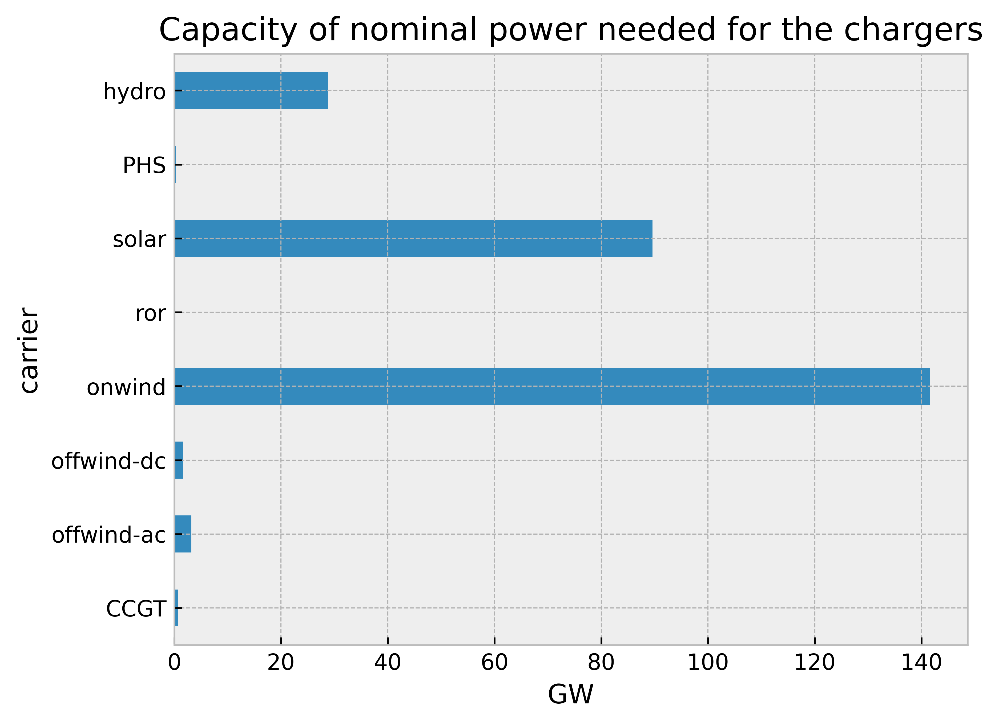

In [208]:
total_gen.div(1e3).plot.barh()
plt.xlabel('GW')
plt.title("Capacity of nominal power needed for the chargers")

Text(0.5, 1.0, 'Capacity of nominal power needed for the chargers')

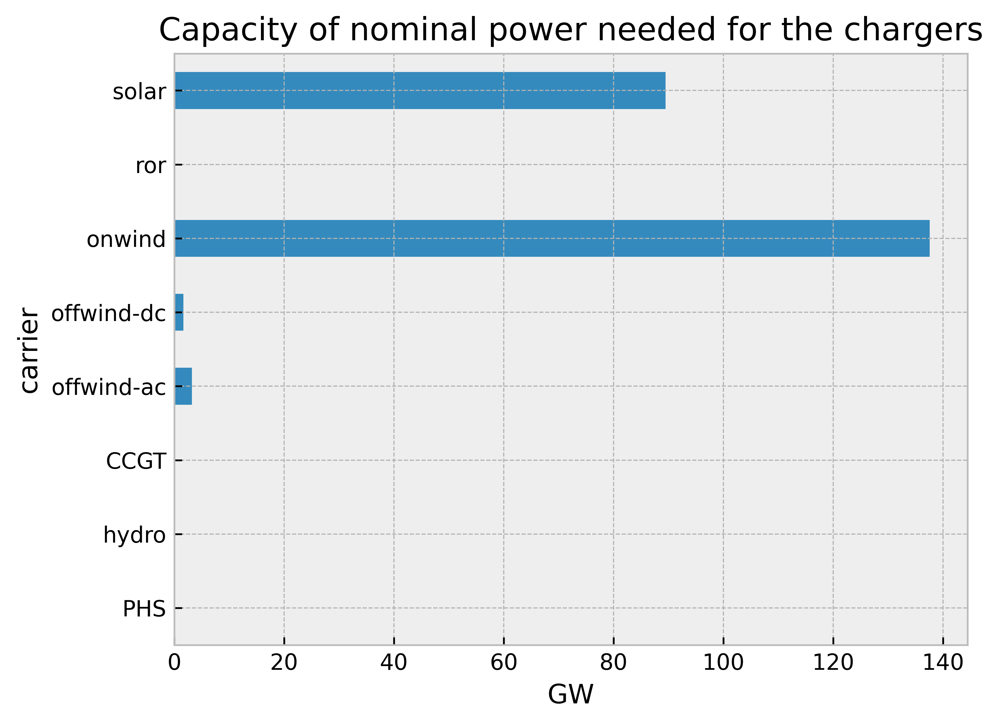

In [209]:
total_exp.div(1e3).plot.barh()
plt.xlabel('GW')
plt.title("Capacity of nominal power needed for the chargers")

In [212]:
total_exp["solar"]/1e3 #GW

89.45270731020771

In [211]:
total_exp["onwind"]/1e3 #GW

137.5764871078585

In [205]:
gen_cost = pd.DataFrame({
    "Cost":n.generators.groupby("carrier").capital_cost.sum(),
    "exp_p":n.generators.groupby("carrier").p_nom_opt.sum()-n.generators.groupby("carrier").p_nom.sum()
})
store_cost = pd.DataFrame({
    "Cost":n.storage_units.groupby("carrier").capital_cost.sum(),
    "exp_p":n.storage_units.groupby("carrier").p_nom_opt.sum()-n.storage_units.groupby("carrier").p_nom.sum()
})
total_cost = pd.concat([gen_cost,store_cost])
(total_cost["Cost"]*total_cost["exp_p"]).sum()/1e9*11.5

7924.269363640296

In [55]:
(n.generators.p_nom*n.generators_t.p_max_pu).sum().sum()/1e6

0.33548344981233547

In [57]:
(n.storage_units.p_nom*n.storage_units_t.p_max_pu).sum().sum()/1e6

0.0

15.440119422969925

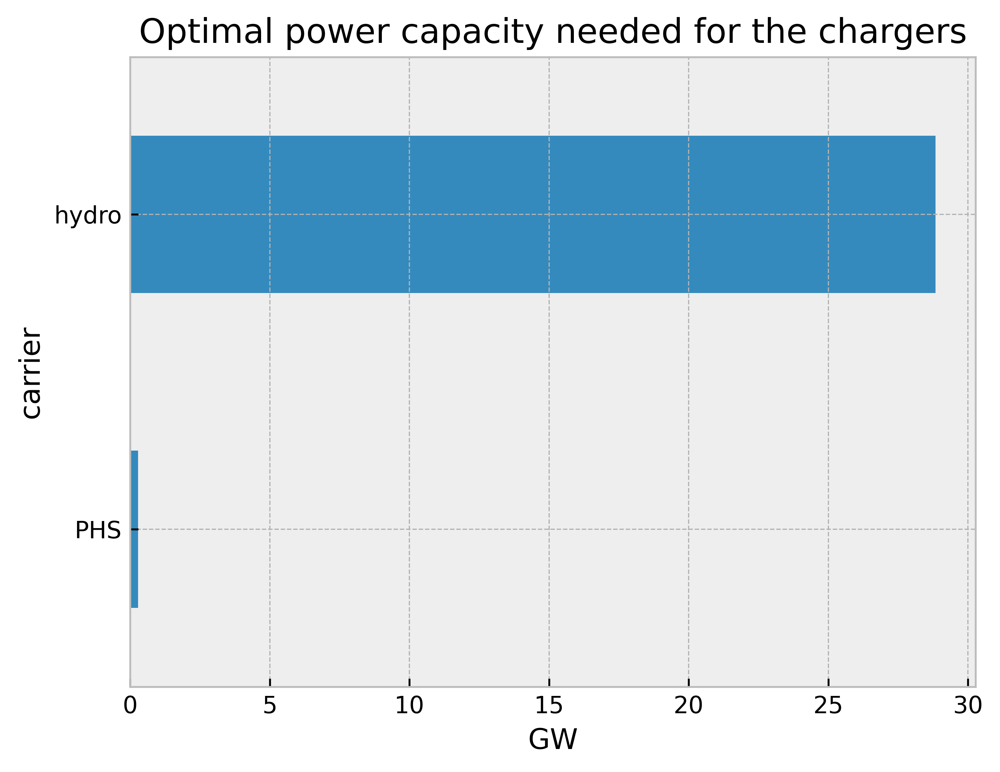

In [115]:
n.storage_units.groupby("carrier").p_nom_opt.sum().div(1e3).plot.barh()
plt.xlabel('GW')
plt.title("Optimal power capacity needed for the chargers")
n.storage_units_t.state_of_charge.sum().sum()/1e9

### Energy storage

Text(0.5, 1.0, 'Total state of charge - Hydro, PHS')

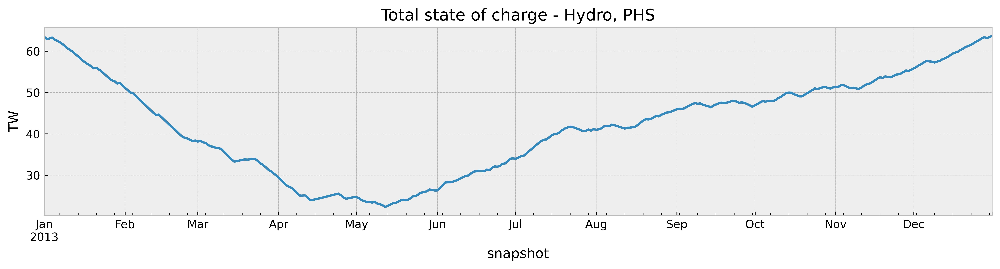

In [180]:
(n.storage_units_t.state_of_charge.sum(axis=1).resample('D').mean() / 1e6).plot(figsize=(15,3))
plt.ylabel("TW")
plt.title("Total state of charge - Hydro, PHS")

<Axes: xlabel='snapshot'>

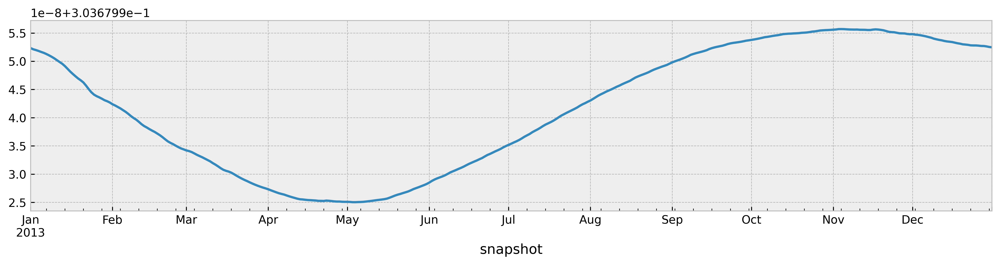

In [101]:
(comp.storage_units_t.state_of_charge.filter(like="PHS",axis=1).sum(axis=1)/1e6).plot(figsize=(15,3))

<Axes: xlabel='snapshot'>

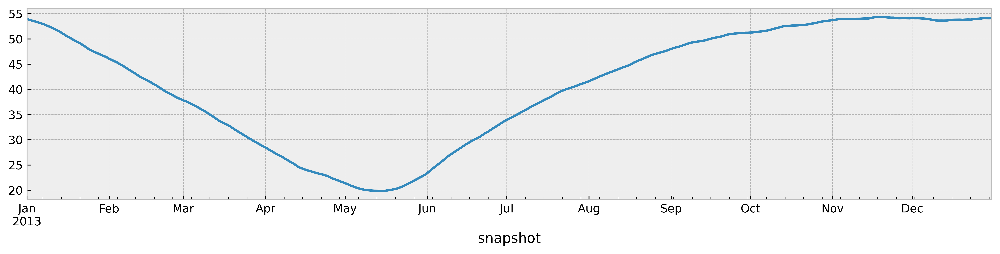

In [100]:
(comp.storage_units_t.state_of_charge.filter(like="hydro",axis=1).sum(axis=1)/1e6).plot(figsize=(15,3))

carrier
CCGT          9.498175e-07
offwind-ac    1.730195e-04
offwind-dc    1.179414e-04
onwind        2.723101e+00
ror           6.032244e-02
solar         0.000000e+00
Name: 2013-01-27 00:00:00, dtype: float64

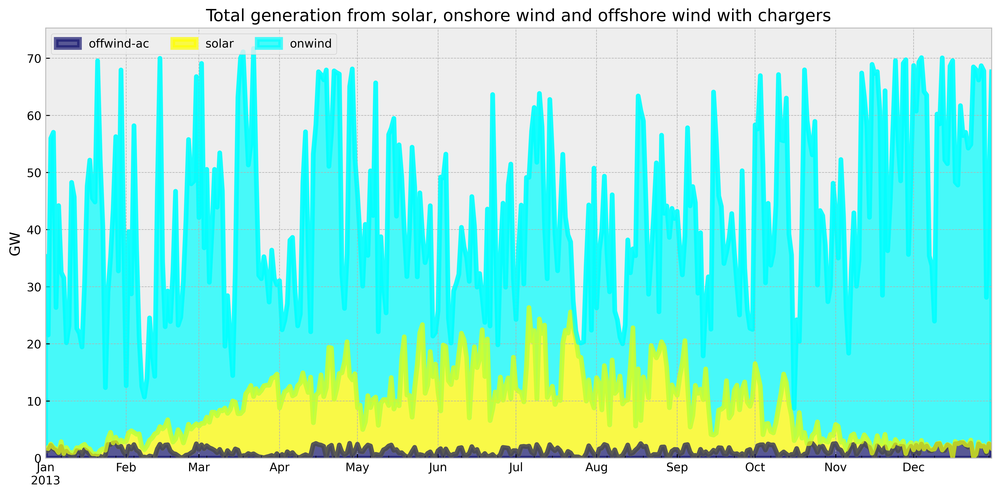

In [232]:
p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
p_by_carrier.drop(
    (p_by_carrier.max()[p_by_carrier.max() < 1700.0]).index, axis=1, inplace=True
)
p_by_carrier.columns

colors = {
    'offwind-ac':"midnightblue",
     'onwind':"cyan",
     'solar':"yellow"
    
}
# reorder
cols = ['offwind-ac', 'solar', 'onwind']
p_by_carrier = p_by_carrier[cols]

c = [colors[col] for col in p_by_carrier.columns]

fig, ax = plt.subplots(figsize=(12, 6))
(p_by_carrier / 1e3).plot(kind="area", ax=ax, linewidth=4, color=c, alpha=0.7)
ax.legend(ncol=4, loc="upper left")
ax.set_ylabel("GW")
ax.set_xlabel("")
plt.title("Total generation from solar, onshore wind and offshore wind with chargers")
fig.tight_layout()


In [243]:
def max_p(network, carrier):# in GW
    max_date = network.generators_t.p.groupby(network.generators.carrier, axis=1).sum()[str(carrier)].idxmax()
    return network.generators_t.p.groupby(network.generators.carrier, axis=1).sum().loc[max_date][str(carrier)]/1e3
def min_p(network, carrier):# in GW
    max_date = network.generators_t.p.groupby(network.generators.carrier, axis=1).sum()[str(carrier)].idxmin()
    return network.generators_t.p.groupby(network.generators.carrier, axis=1).sum().loc[max_date][str(carrier)]/1e3
print("Max wind gen", max_p(comp,"onwind"))
print("Min wind gen", min_p(comp,"onwind"))

Max wind gen 4.433520366377898
Min wind gen 0.0514454778260648


In [175]:
p_by_carrier = comp.generators_t.p.groupby(comp.generators.carrier, axis=1).sum()
p_by_carrier.drop(
    (p_by_carrier.max()[p_by_carrier.max() < 1700.0]).index, axis=1, inplace=True
)
p_by_carrier.columns

Index(['onwind'], dtype='object', name='carrier')

In [177]:
colors = {
    'offwind-ac':"midnightblue",
     'onwind':"cyan",
     'solar':"yellow"
    
}
# reorder
cols = ['onwind']
p_by_carrier = p_by_carrier[cols]

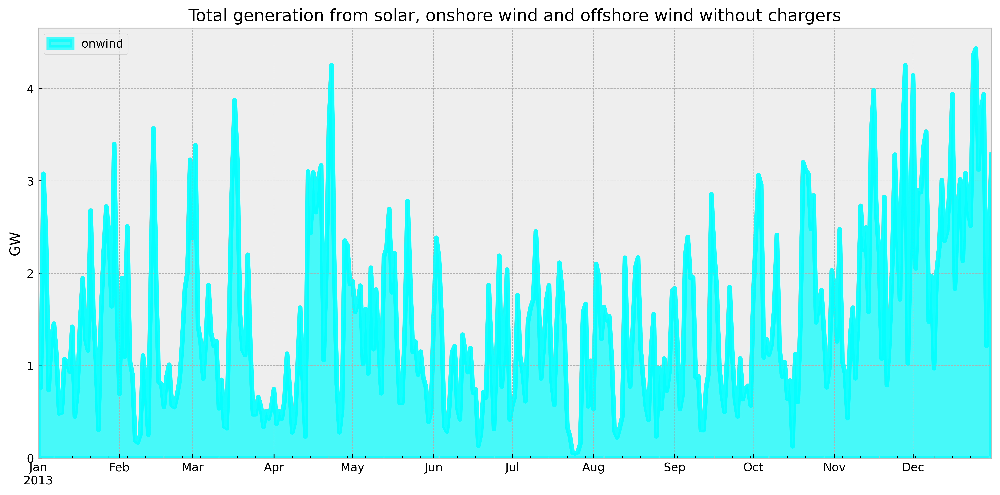

In [178]:
c = [colors[col] for col in p_by_carrier.columns]

fig, ax = plt.subplots(figsize=(12, 6))
(p_by_carrier / 1e3).plot(kind="area", ax=ax, linewidth=4, color=c, alpha=0.7)
ax.legend(ncol=4, loc="upper left")
ax.set_ylabel("GW")
ax.set_xlabel("")
plt.title("Total generation from solar, onshore wind and offshore wind without chargers")
fig.tight_layout()

In [75]:
onwind = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()["onwind"].sum()/1e9
solar = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()["solar"].sum()/1e9
CCGT = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()["CCGT"].sum()/1e9
offwind_ac = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()["offwind-ac"].sum()/1e9
offwind_dc = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()["offwind-dc"].sum()/1e9

In [74]:
hydro = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum()["hydro"].sum()/1e9
PHS = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum()["PHS"].sum()/1e9

Text(0.5, 1.0, 'Distribution of electricity production')

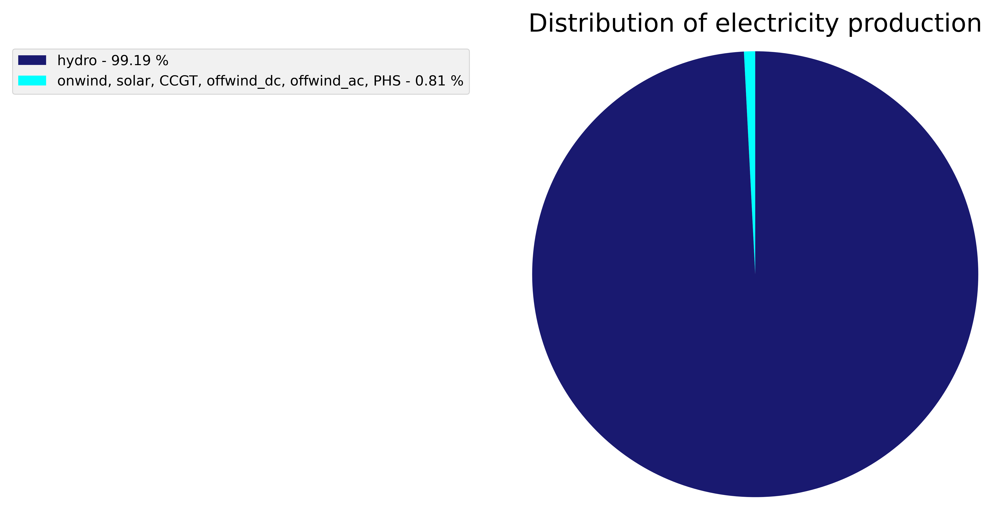

In [99]:
labels = ['onwind, solar, CCGT, offwind_dc, offwind_ac, PHS', 'hydro']
sizes = [onwind + solar + CCGT + offwind_dc + offwind_ac + PHS, hydro]

import numpy as np

x = np.char.array(labels)
y = np.array(sizes)
colors = ['cyan', 'midnightblue']
porcent = 100.*y/y.sum()

patches, texts = plt.pie(y, colors=colors, startangle=90, radius=1.2)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, porcent)]

sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='best', bbox_to_anchor=(-0.1, 1.),
           fontsize=8)
plt.title("Distribution of electricity production")